In [ ]:
# For running inference on the TF-Hub module.
import tensorflow as tf

import tensorflow_hub as hub

# For downloading the image.
import matplotlib.pyplot as plt
import tempfile
from six.moves.urllib.request import urlopen
from six import BytesIO

# For drawing onto the image.
import numpy as np
from PIL import Image
from PIL import ImageColor
from PIL import ImageDraw
from PIL import ImageFont
from PIL import ImageOps
def display_image(image):
  fig = plt.figure(figsize=(20, 15))
  plt.grid(False)
  plt.imshow(image)


def download_and_resize_image(url, new_width=256, new_height=256,
                              display=False):
  _, filename = tempfile.mkstemp(suffix=".jpg")
  response = urlopen(url)
  image_data = response.read()
  image_data = BytesIO(image_data)
  pil_image = Image.open(image_data)
  pil_image = ImageOps.fit(pil_image, (new_width, new_height), Image.ANTIALIAS)
  pil_image_rgb = pil_image.convert("RGB")
  pil_image_rgb.save(filename, format="JPEG", quality=90)
  print("Image downloaded to %s." % filename)
  if display:
    display_image(pil_image)
  return filename


def draw_bounding_box_on_image(image,
                               ymin,
                               xmin,
                               ymax,
                               xmax,
                               color,
                               font,
                               thickness=4,
                               display_str_list=()):
  """Adds a bounding box to an image."""
  draw = ImageDraw.Draw(image)
  im_width, im_height = image.size
  (left, right, top, bottom) = (xmin * im_width, xmax * im_width,
                                ymin * im_height, ymax * im_height)
  draw.line([(left, top), (left, bottom), (right, bottom), (right, top),
             (left, top)],
            width=thickness,
            fill=color)

  # If the total height of the display strings added to the top of the bounding
  # box exceeds the top of the image, stack the strings below the bounding box
  # instead of above.
  display_str_heights = [font.getsize(ds)[1] for ds in display_str_list]
  # Each display_str has a top and bottom margin of 0.05x.
  total_display_str_height = (1 + 2 * 0.05) * sum(display_str_heights)

  if top > total_display_str_height:
    text_bottom = top
  else:
    text_bottom = top + total_display_str_height
  # Reverse list and print from bottom to top.
  for display_str in display_str_list[::-1]:
    text_width, text_height = font.getsize(display_str)
    margin = np.ceil(0.05 * text_height)
    draw.rectangle([(left, text_bottom - text_height - 2 * margin),
                    (left + text_width, text_bottom)],
                   fill=color)
    draw.text((left + margin, text_bottom - text_height - margin),
              display_str,
              fill="black",
              font=font)
    text_bottom -= text_height - 2 * margin


def draw_boxes(image, boxes, class_names, scores, max_boxes=100, min_score=0.06):
  """Overlay labeled boxes on an image with formatted scores and label names."""
  colors = list(ImageColor.colormap.values())

  try:
    font = ImageFont.truetype("/usr/share/fonts/truetype/liberation/LiberationSansNarrow-Regular.ttf",
                              25)
  except IOError:
    print("Font not found, using default font.")
    font = ImageFont.load_default()

  # for i in range(min(boxes.shape[0], max_boxes)):
  for i in range(min(boxes.shape[0], max_boxes)):
    if scores[i] >= min_score:
      ymin, xmin, ymax, xmax = tuple(boxes[i])
      display_str = "{}: {}%".format(class_names[i].decode("ascii"),
                                     int(100 * scores[i]))
      color = colors[hash(class_names[i]) % len(colors)]
      image_pil = Image.fromarray(np.uint8(image)).convert("RGB")
      draw_bounding_box_on_image(
          image_pil,
          ymin,
          xmin,
          ymax,
          xmax,
          color,
          font,
          display_str_list=[display_str])
      np.copyto(image, np.array(image_pil))
  
  return image
from skimage.transform import resize
import tensorflow as tf
from tensorflow.keras import layers
from keras.models import Model
base_model=tf.keras.applications.InceptionResNetV2(
    include_top=True, weights='imagenet',
)
inp_model=base_model.layers[0].input
out_model=base_model.layers[-2].output
fmodel=Model(inputs=inp_model,outputs=out_model)
fmodel.summary()
def predict(img, model: Model):

    img = resize(img, (299, 299))
    x = np.expand_dims(img, axis=0)
    # print(x.flags)
    # x.setflags(write=1)
    x = tf.keras.applications.mobilenet.preprocess_input(x)
    return model.predict(x)
def load_img(path):
  img = tf.io.read_file(path)
  img = tf.image.decode_jpeg(img, channels=3)
  return img





225214464/225209952 [==============================] - 3s 0us/step
Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 299, 299, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 149, 149, 32) 864         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 149, 149, 32) 96          conv2d[0][0]                     
__________________________________________________________________________________________________
activation (Activation)         (None, 149, 149, 32) 0           batch_normalization[0][0]        
___________________________

In [ ]:
lst=[(0,0,2,2),(0,0,1,1),(0,0,4,4)]
def calc_dist(x,y):
  return ((x[0]+x[2])-(y[0]+y[2]))**2 + ((x[1]+x[3])-(y[1]+y[3]))**2
res =sorted(lst,key=lambda x: calc_dist(x,(0,0,0,0)))
print(res)

[(0, 0, 1, 1), (0, 0, 2, 2), (0, 0, 4, 4)]


In [ ]:

def calc_dist(x,y):
  return ((x[0]+x[2])-(y[0]+y[2]))**2 + ((x[1]+x[3])-(y[1]+y[3]))**2
def calc_dist_3points(x,y,z,w):
  return ((x[0]+x[2])-(y[0]+y[2]))**2 + ((x[1]+x[3])-(y[1]+y[3]))**2 + ((x[0]+x[2])-(z[0]+z[2]))**2 + ((x[1]+x[3])-(z[1]+z[3]))**2 + ((x[0]+x[2])-(w[0]+w[2]))**2 + ((x[1]+x[3])-(w[1]+w[3]))**2
def get_features_and_seperate_person_and_objects(image,boxes,class_names,scores,max_objects=5,max_people=3,min_score=0.05):
  img_height, img_width, img_channel = image.shape
  print("image shape", image.shape)
  object_coord = []
  people_coord = []
  lst=['Person','Human','Man','Child','Woman','Boy','Girl','Toddler','Baby']
  for i in range(int(boxes.shape[0])):
      if scores[i] >= min_score:
        ymin, xmin, ymax, xmax = tuple(boxes[i])
        x_up = int(xmin*img_width)
        y_up = int(ymin*img_height)
        x_down = int(xmax*img_width)
        y_down = int(ymax*img_height)
        print("x_up,y_up, x_down, y_down", x_up,y_up, x_down, y_down)
        if class_names[i].decode("ascii") in lst:
          if (len(people_coord)<max_people):
            people_coord.append((x_up,y_up,x_down,y_down))        
        else:
          object_coord.append((x_up,y_up,x_down,y_down))

  bounding_box_img = []
  people_box_img = []
  map_people={}
  map_object={}
  for c in object_coord:
    print("c is ", c[1])
    u=image[c[1]:c[3], c[0]:c[2],:]
    print("u is:", u.shape)
    feat=predict(u,fmodel)
    print("object feat is:", feat.shape)
    map_object.update({c:feat})
  for c in people_coord:
    print("c is ", c)
    u=image[c[1]:c[3], c[0]:c[2],:]
    feat=predict(u,fmodel)
    print("person feat is:", feat.shape)
    map_people.update({c:feat})
  a=np.zeros((1,1536))
  print("a is",a.shape)
  # if len(people_coord)<max_people:
  #   for u in range(max_people-len(people_coord)):
  #     map_people.update({(0,0,0,0),a})
  # print("map_people", map_people)
  node_features=[]
  cnt=0
  for c in people_coord:
    temp =sorted(object_coord, key=lambda x: calc_dist(x,c) ) 
    ###taking top 3 objects joins
    feats=[]
    feats.append(map_people[c])
    if (len(temp)>=max_people):
      feats.append(map_object[temp[0]])
      feats.append(map_object[temp[1]])
      feats.append(map_object[temp[2]])
    else:
      for i in temp:
        feats.append(map_object[i])
      for u in range(max_people-len(temp)):
        feats.append(a)
    node_features.append(feats)
  
  if len(people_coord)<max_people:
    for u in range(max_people-len(people_coord)):
      temp =sorted(object_coord, key=lambda x: calc_dist(x,(0,0,0,0)) ) ##taking top 3 objects joins
      feats=[]
      feats.append(a)
      
      if (len(temp)>=max_people):
        feats.append(map_object[temp[0]])
        feats.append(map_object[temp[1]])
        feats.append(map_object[temp[2]])
      else:
        for i in temp:
          feats.append(map_object[i])
        for u in range(max_people-len(temp)):
          feats.append(a)
      node_features.append(feats)

  ### creation of last gcn layer
  feats=[]
  for c in people_coord:
    feats.append(map_people[c])
  if len(people_coord)<max_people:
      for u in range(max_people-len(people_coord)):
        feats.append(a)
  for c in people_coord:
    feats.append(map_people[c])
  if len(people_coord)<max_people:
      for u in range(max_people-len(people_coord)):
        feats.append(a)
  
  node_features.append(feats)
  
  ###since 4 layers are returned (for now)
  return np.array(node_features[0]),np.array(node_features[1]),np.array(node_features[2]),np.array(node_features[3])


In [ ]:
# def calc_dist(x,y):
#   return ((x[0]+x[2])-(y[0]+y[2]))**2 + ((x[1]+x[3])-(y[1]+y[3]))**2
# def calc_dist_3points(x,y,z,w):
#   return ((x[0]+x[2])-(y[0]+y[2]))**2 + ((x[1]+x[3])-(y[1]+y[3]))**2 + ((x[0]+x[2])-(z[0]+z[2]))**2 + ((x[1]+x[3])-(z[1]+z[3]))**2 + ((x[0]+x[2])-(w[0]+w[2]))**2 + ((x[1]+x[3])-(w[1]+w[3]))**2
# def get_features_and_seperate_person_and_objects(image,boxes,class_names,scores,max_objects=5,max_people=3,min_score=0.05):
#   img_height, img_width, img_channel = image.shape
#   print("image shape", image.shape)
#   object_coord = []
#   people_coord = []
  
#   for i in range(int(boxes.shape[0])):
#       if scores[i] >= min_score:
#         ymin, xmin, ymax, xmax = tuple(boxes[i])
#         x_up = int(xmin*img_width)
#         y_up = int(ymin*img_height)
#         x_down = int(xmax*img_width)
#         y_down = int(ymax*img_height)
#         print("x_up,y_up, x_down, y_down", x_up,y_up, x_down, y_down)
#         if class_names[i].decode("ascii")=='person':
#           if (len(people_coord)<max_people):
#             people_coord.append((x_up,y_up,x_down,y_down))        
#         else:
#           object_coord.append((x_up,y_up,x_down,y_down))

#   bounding_box_img = []
#   people_box_img = []
#   map_people={}
#   map_object={}
#   for c in object_coord:
#     print("c is ", c[1])
#     u=image[c[1]:c[3], c[0]:c[2],:]
#     print("u is:", u.shape)
#     feat=predict(u,fmodel)
#     print("object feat is:", feat.shape)
#     map_object.update({c:feat})
#   if people_coord is not None:
#     for c in people_coord:
#       print("c is ", c)
#       u=image[c[1]:c[3], c[0]:c[2],:]
#       feat=predict(u,fmodel)
#       print("person feat is:", feat.shape)
#       map_people.update({c:feat})
#   a=np.zeros((1,1536))
#   print("a is",a.shape)
#   if len(people_coord)<max_people:
#     for u in range(max_people-len(people_coord)):
#       #map_people({(0,0,0,0),a})
#       map_people(a, numpy.zeros(shape=(4)))
#   print("map_people", map_people)
#   node_features=[]
#   cnt=0
#   for c in people_coord:
#     temp =sorted(object_coord, key=lambda x: calc_dist(x,c) ) 
#     ###taking top 3 objects joins
#     feats=[]
#     feats.append(map_people[c])
#     feats.append(map_object[temp[0]])
#     feats.append(map_object[temp[1]])
#     feats.append(map_object[temp[2]])
#     node_features.append(feats)
  
#   if len(people_coord)<max_people:
#     for u in range(max_people-len(people_coord)):
#       temp =sorted(object_coord, key=lambda x: calc_dist(x,(0,0,0,0)) ) ##taking top 3 objects joins
#       feats=[]
#       feats.append(a)
#       feats.append(map_object[temp[0]])
#       feats.append(map_object[temp[1]])
#       feats.append(map_object[temp[2]])
#       node_features.append(feats)

#   ### creation of last gcn layer
#   feats=[]
#   for c in people_coord:
#     feats.append(map_people[c])
#   for c in people_coord:
#     feats.append(map_people[c])
  
#   node_features.append(feats)
  
#   ###since 4 layers are returned (for now)
#   return np.array(node_features[0]),np.array(node_features[1]),np.array(node_features[2]),np.array(node_features[3])


In [ ]:
import time
def run_detector(detector, path):
  img = load_img(path)


  converted_img  = tf.image.convert_image_dtype(img, tf.float32)[tf.newaxis, ...]
  start_time = time.time()
  result = detector(converted_img)
  end_time = time.time()
  img=img.numpy()
  print("type of image",type(img))

  result = {key:value.numpy() for key,value in result.items()}
  # print(result.detection_boxes)
  print("Found %d objects." % len(result["detection_scores"]))
  print("Inference time: ", end_time-start_time)
  
  image_with_boxes = draw_boxes(
      img, result["detection_boxes"],
      result["detection_class_entities"], result["detection_scores"])
  
  display_image(image_with_boxes)
  # image,boxes,class_names,scores,max_objects=5,max_people=3,min_score=0.05
  feat1,feat2,feat3,feat4 = get_features_and_seperate_person_and_objects(img, result["detection_boxes"],result["detection_class_entities"],result["detection_scores"])
  # feat1,feat2=get_features(img.numpy(),result["detection_boxes"],result["detection_class_entities"],result["detection_scores"])
  feat1= feat1.reshape(feat1.shape[0],(feat1.shape[1]*feat1.shape[2]))
  feat2= feat2.reshape(feat2.shape[0],(feat2.shape[1]*feat2.shape[2]))
  feat3= feat3.reshape(feat3.shape[0],(feat3.shape[1]*feat3.shape[2]))
  feat4= feat4.reshape(feat4.shape[0],(feat4.shape[1]*feat4.shape[2]))
  # new_img = img.reshape((img.shape[0]*img.shape[1]), img.shape[2])
  # print(feat.shape)
  return feat1,feat2,feat3,feat4

In [ ]:
base_model=tf.keras.applications.InceptionResNetV2(
    include_top=True, weights='imagenet',
)
inp_model=base_model.layers[0].input
out_model=base_model.layers[-2].output
fmodel=Model(inputs=inp_model,outputs=out_model)
fmodel.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 299, 299, 3) 0                                            
__________________________________________________________________________________________________
conv2d_203 (Conv2D)             (None, 149, 149, 32) 864         input_2[0][0]                    
__________________________________________________________________________________________________
batch_normalization_203 (BatchN (None, 149, 149, 32) 96          conv2d_203[0][0]                 
__________________________________________________________________________________________________
activation_203 (Activation)     (None, 149, 149, 32) 0           batch_normalization_203[0][0]    
____________________________________________________________________________________________

In [ ]:
# For running inference on the TF-Hub module.
import tensorflow as tf

import tensorflow_hub as hub
module_handle = "https://tfhub.dev/google/faster_rcnn/openimages_v4/inception_resnet_v2/1"

detector = hub.load(module_handle).signatures['default']

INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
cd /content/drive/Shareddrives/MTP_Project[Sem_8]/new_weights/

/content/drive/Shareddrives/MTP_Project[Sem_8]/new_weights


4
type of image <class 'numpy.ndarray'>
Found 100 objects.
Inference time:  32.66631197929382
image shape (333, 500, 3)
x_up,y_up, x_down, y_down 1 50 70 172
x_up,y_up, x_down, y_down 157 39 339 178
x_up,y_up, x_down, y_down 154 21 330 182
x_up,y_up, x_down, y_down 160 46 333 182
x_up,y_up, x_down, y_down 160 43 332 178
x_up,y_up, x_down, y_down 156 39 336 180
x_up,y_up, x_down, y_down 146 45 342 180
c is  50
u is: (122, 69, 3)
object feat is: (1, 1536)
c is  39
u is: (139, 182, 3)
object feat is: (1, 1536)
c is  21
u is: (161, 176, 3)
object feat is: (1, 1536)
c is  46
u is: (136, 173, 3)
object feat is: (1, 1536)
c is  43
u is: (135, 172, 3)
object feat is: (1, 1536)
c is  39
u is: (141, 180, 3)
object feat is: (1, 1536)
c is  45
u is: (135, 196, 3)
object feat is: (1, 1536)
a is (1, 1536)
type of image <class 'numpy.ndarray'>
Found 100 objects.
Inference time:  31.389618635177612
image shape (371, 500, 3)
x_up,y_up, x_down, y_down 8 7 261 272
x_up,y_up, x_down, y_down 403 207 462 27

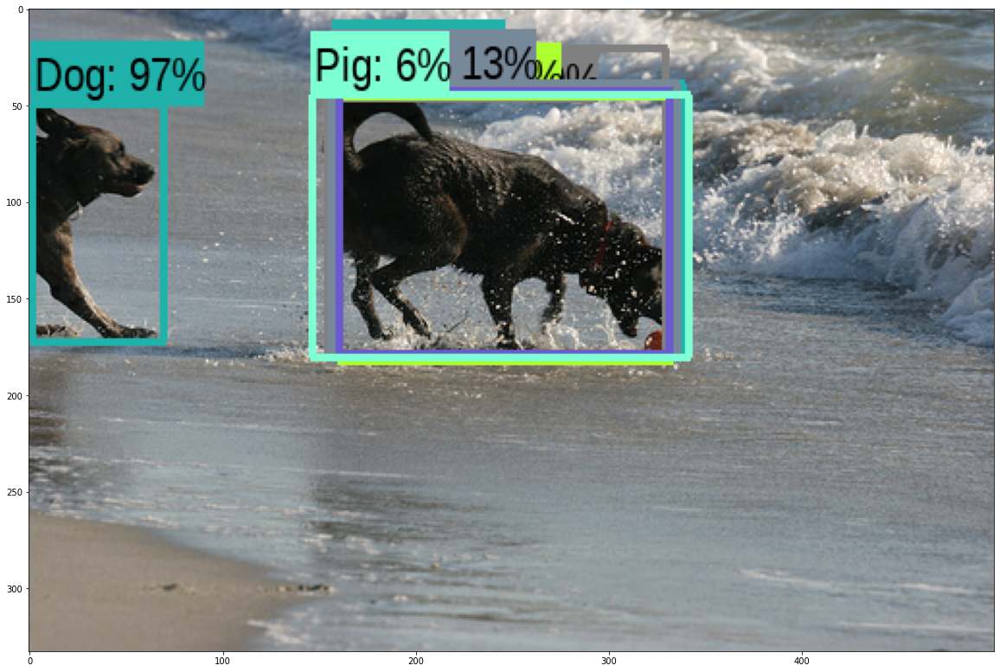

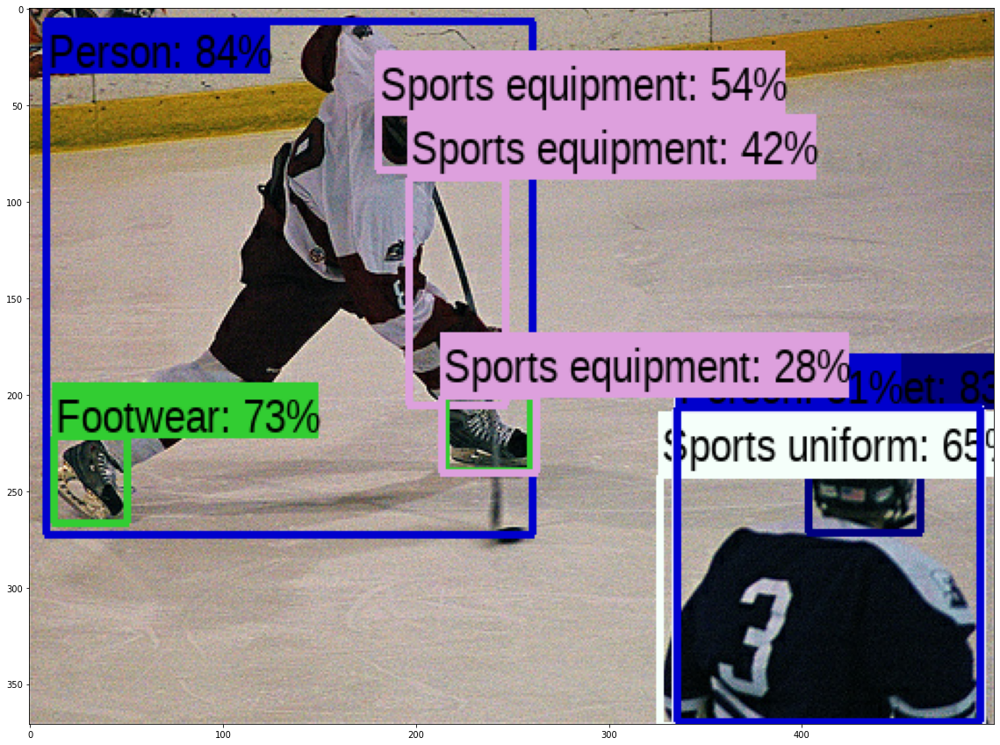

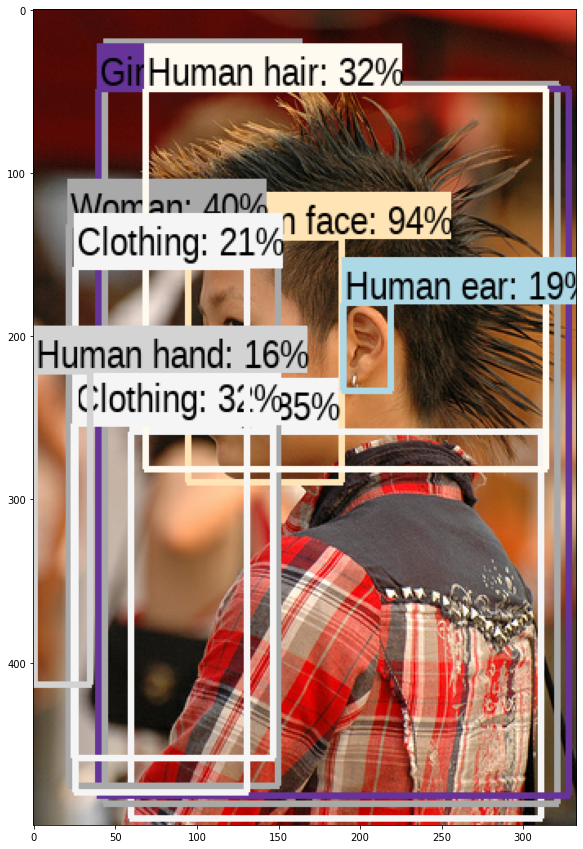

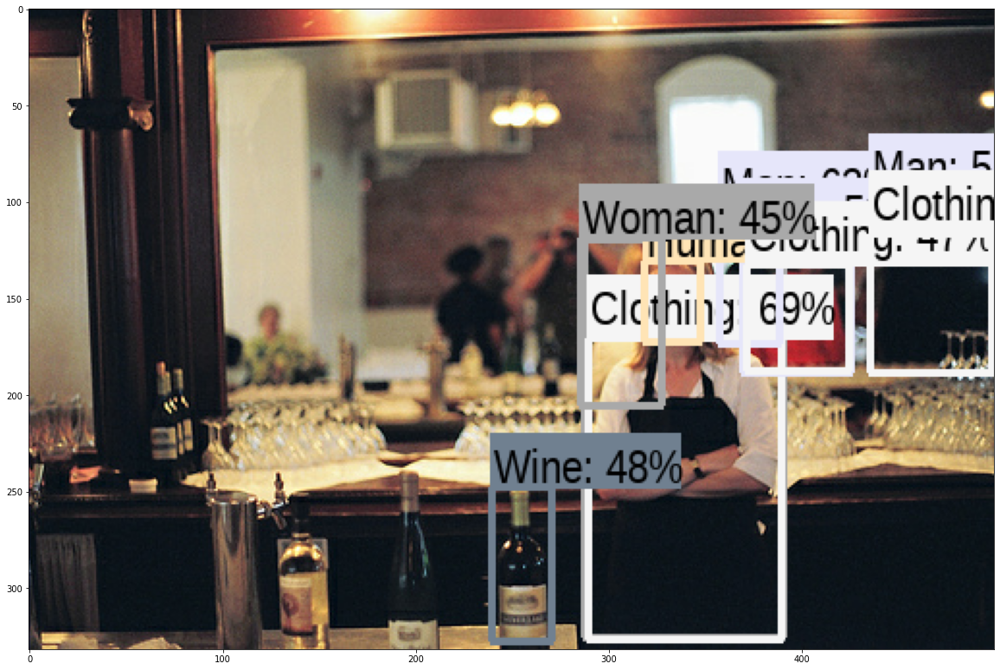

In [ ]:
###test on some images in a directory
import tensorflow as tf
from tensorflow.keras import layers, models
from keras.models import Model
from os import listdir
from pickle import dump
import glob
import numpy

from keras.preprocessing.image import img_to_array
from keras.applications.vgg16 import preprocess_input
from keras.models import Model
 
# extract features from each photo in the directory

def extract_features(directory):
	# load the model
  features = dict()
  # return features
  TEST_IMGS = glob.glob(directory+'/*.jpg')
  print(len(TEST_IMGS))
  curr=0
  for image_path in TEST_IMGS:
    print('image no:',curr)
    curr=curr+1
    a1,a2,a3,a4=run_detector(detector, image_path)
    # print(a)
    image_id = image_path.split('.')[0]
    image_id=image_id.split('/')[-1]
    # store feature
    features[image_id] = (a1,a2,a3,a4)
  return features
 
# extract features from all images
directory = '/content/drive/MyDrive/Flickr/tests'
features = extract_features(directory)
print('Extracted Features: %d' % len(features))
# save to file
dump(features, open('/content/drive/MyDrive/Flickr/objecsandsubjects.pkl', 'wb'))

In [ ]:
import glob
TEST_IMGS = glob.glob('/content/drive/MyDrive/Flickr/tests/*.jpg')
print(len(TEST_IMGS))

4


type of image <class 'numpy.ndarray'>
Found 100 objects.
Inference time:  32.825639724731445
image shape (333, 500, 3)
x_up,y_up, x_down, y_down 1 50 70 172
x_up,y_up, x_down, y_down 157 39 339 178
x_up,y_up, x_down, y_down 154 21 330 182
x_up,y_up, x_down, y_down 160 46 333 182
x_up,y_up, x_down, y_down 160 43 332 178
x_up,y_up, x_down, y_down 156 39 336 180
x_up,y_up, x_down, y_down 146 45 342 180
c is  50
u is: (122, 69, 3)
object feat is: (1, 1536)
c is  39
u is: (139, 182, 3)
object feat is: (1, 1536)
c is  21
u is: (161, 176, 3)
object feat is: (1, 1536)
c is  46
u is: (136, 173, 3)
object feat is: (1, 1536)
c is  43
u is: (135, 172, 3)
object feat is: (1, 1536)
c is  39
u is: (141, 180, 3)
object feat is: (1, 1536)
c is  45
u is: (135, 196, 3)
object feat is: (1, 1536)
a is (1, 1536)
(array([[0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.00999736, 0.01285388, 0.00302489, ..., 0.13004625, 0.04662876,
        0.00926147],
       [0

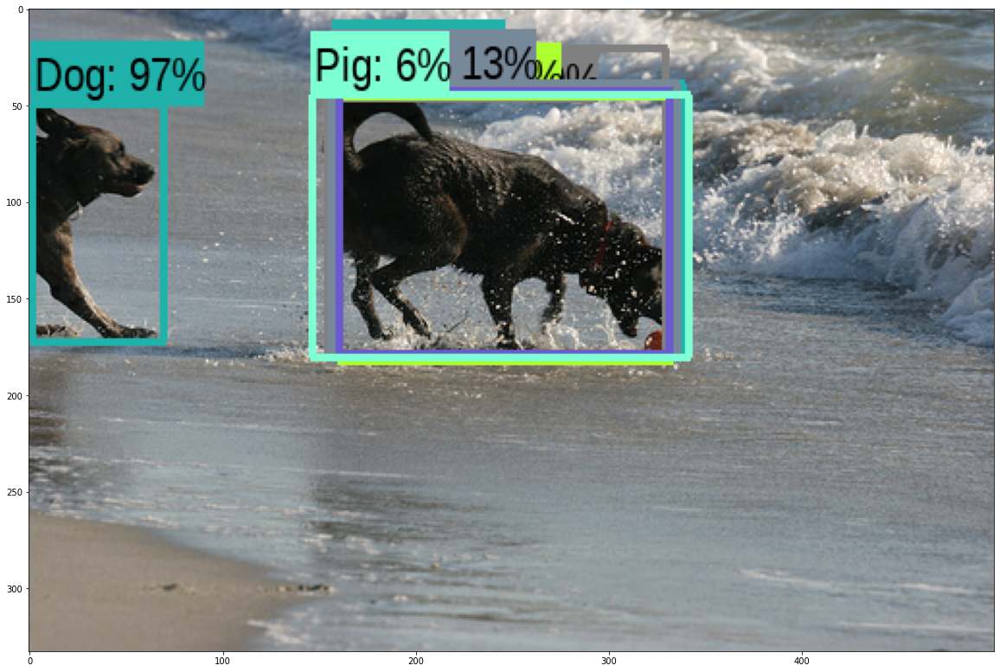

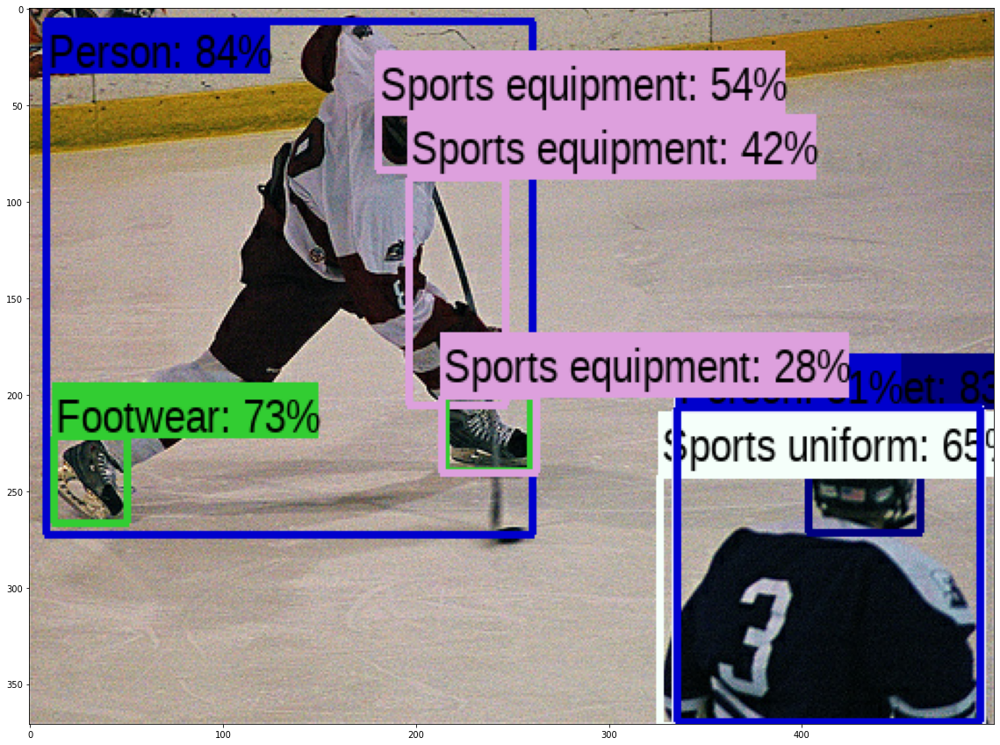

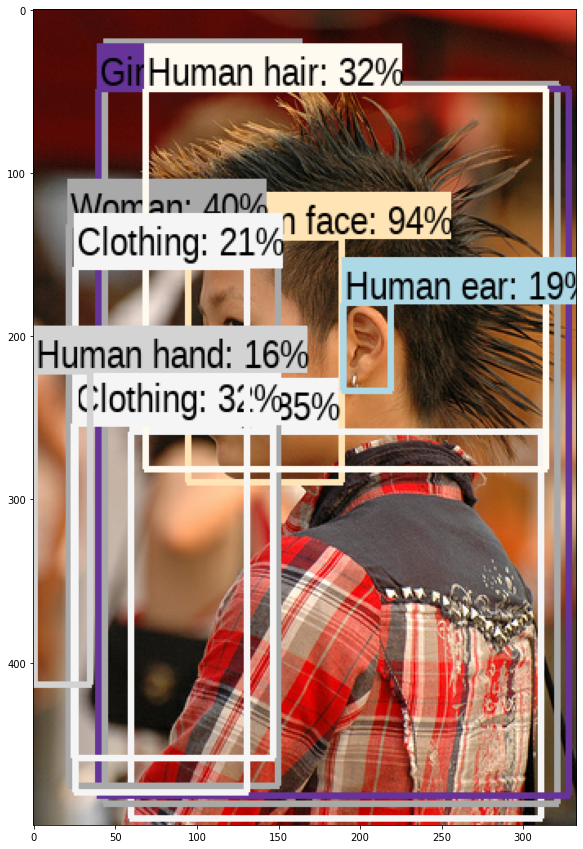

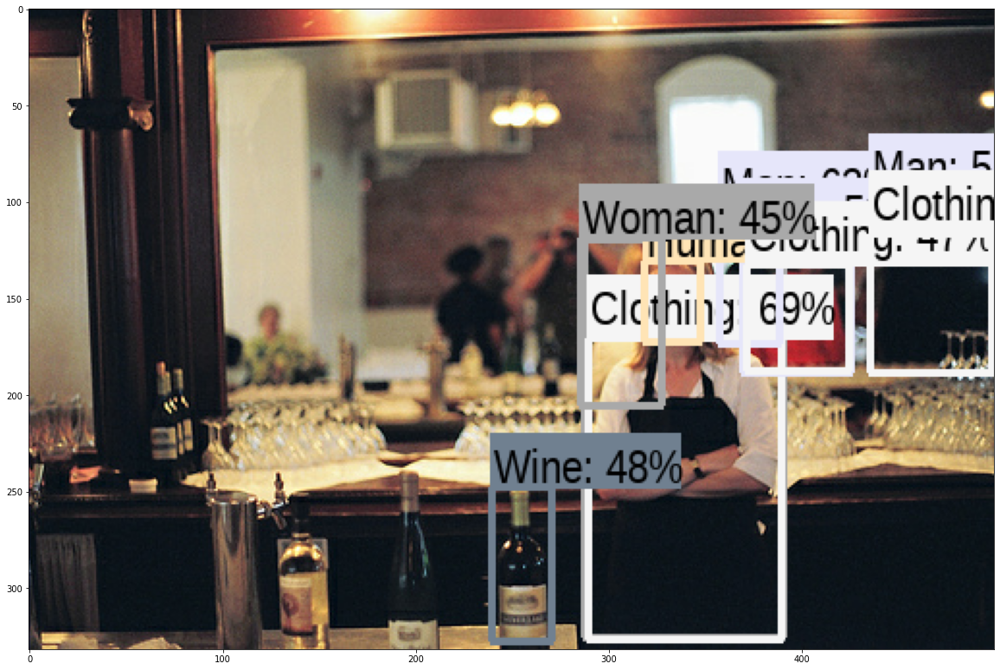

In [ ]:
f=[]
for image_path in TEST_IMGS:
  a=run_detector(detector, image_path)
  print(a)
  f.append(a)


In [ ]:
###Whole dataset
import tensorflow as tf
from tensorflow.keras import layers, models
from keras.models import Model
from os import listdir
from pickle import dump
import glob
import numpy

from keras.preprocessing.image import img_to_array
from keras.applications.vgg16 import preprocess_input
from keras.models import Model
 
# extract features from each photo in the directory

def extract_features(directory):
	# load the model
  features = dict()
  # return features
  TEST_IMGS = glob.glob(directory+'/*.jpg')
  print(len(TEST_IMGS))
  curr=0
  for image_path in TEST_IMGS:
    print('image no:',curr)
    curr=curr+1
    a1,a2,a3,a4=run_detector(detector, image_path)
    # print(a)
    image_id = image_path.split('.')[0]
    image_id=image_id.split('/')[-1]
    # store feature
    features[image_id] = (a1,a2,a3,a4)
  return features
 
# extract features from all images
directory = '/content/drive/MyDrive/Flickr/Flicker8k_Dataset'
features = extract_features(directory)
print('Extracted Features: %d' % len(features))
# save to file
dump(features, open('/content/drive/MyDrive/Flickr/flickr_objecsandsubjects.pkl', 'wb'))

8091
image no: 0
type of image <class 'numpy.ndarray'>
Found 100 objects.
Inference time:  28.02398133277893
image shape (500, 375, 3)
x_up,y_up, x_down, y_down 109 181 171 260
x_up,y_up, x_down, y_down 126 426 156 471
x_up,y_up, x_down, y_down 346 135 369 172
x_up,y_up, x_down, y_down 94 438 127 456
x_up,y_up, x_down, y_down 299 226 324 251
x_up,y_up, x_down, y_down 271 36 356 251
x_up,y_up, x_down, y_down 140 15 261 79
x_up,y_up, x_down, y_down 58 69 189 465
x_up,y_up, x_down, y_down 273 34 356 254
x_up,y_up, x_down, y_down 346 135 371 172
x_up,y_up, x_down, y_down 51 69 189 472
x_up,y_up, x_down, y_down 62 133 181 443
x_up,y_up, x_down, y_down 57 54 188 475
x_up,y_up, x_down, y_down 102 108 137 154
x_up,y_up, x_down, y_down 276 59 348 207
x_up,y_up, x_down, y_down 120 188 175 244
x_up,y_up, x_down, y_down 307 225 327 248
x_up,y_up, x_down, y_down 55 131 184 459
x_up,y_up, x_down, y_down 251 66 272 128
x_up,y_up, x_down, y_down 80 260 167 443
x_up,y_up, x_down, y_down 252 66 274 128


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Streaming output truncated to the last 5000 lines.
x_up,y_up, x_down, y_down 221 164 309 491
x_up,y_up, x_down, y_down 218 93 236 128
x_up,y_up, x_down, y_down 80 1 256 174
x_up,y_up, x_down, y_down 73 149 259 331
c is  29
u is: (157, 121, 3)
object feat is: (1, 1536)
c is  144
u is: (263, 196, 3)
object feat is: (1, 1536)
c is  143
u is: (323, 225, 3)
object feat is: (1, 1536)
c is  148
u is: (251, 200, 3)
object feat is: (1, 1536)
c is  4
u is: (146, 189, 3)
object feat is: (1, 1536)
c is  85
u is: (15, 34, 3)
object feat is: (1, 1536)
c is  348
u is: (152, 70, 3)
object feat is: (1, 1536)
c is  145
u is: (262, 195, 3)
object feat is: (1, 1536)
c is  94
u is: (44, 37, 3)
object feat is: (1, 1536)
c is  142
u is: (348, 78, 3)
object feat is: (1, 1536)
c is  89
u is: (18, 37, 3)
object feat is: (1, 1536)
c is  370
u is: (130, 76, 3)
object feat is: (1, 1536)
c is  136
u is: (26, 58, 3)
object feat is: (1, 1536)
c is  164
u is: (327, 88, 3)
object feat is: (1, 1536)
c is  93
u is: (35, 

8091
type of image <class 'numpy.ndarray'>
Found 100 objects.
Inference time:  29.478498458862305
image shape (333, 500, 3)
x_up,y_up, x_down, y_down 162 42 410 290
c is  42
u is: (248, 248, 3)
object feat is: (1, 1536)
a is (1, 1536)


TypeError: ignored

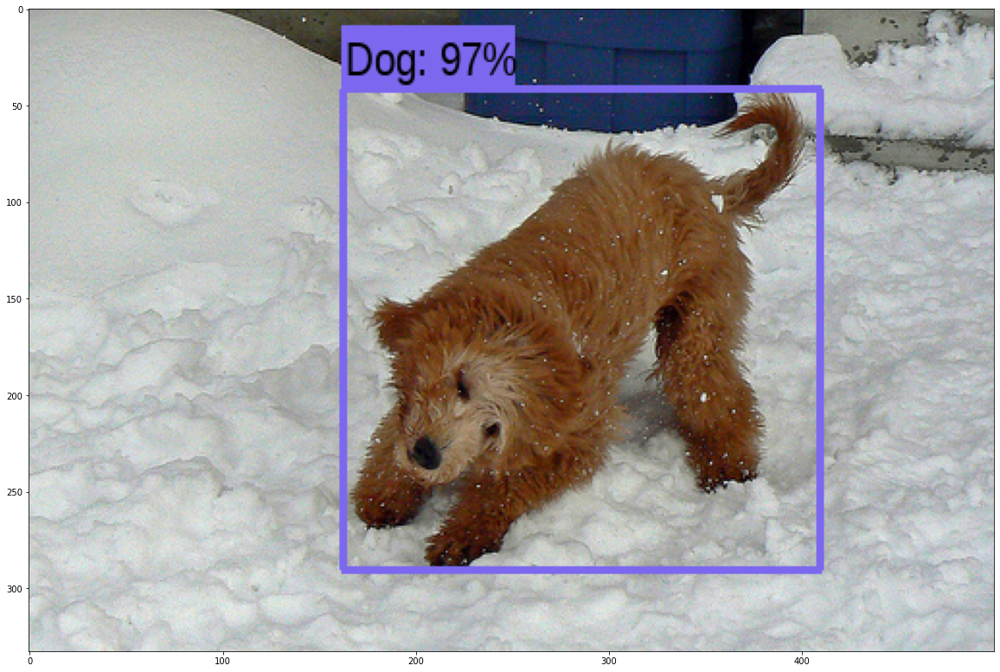

In [ ]:
# import tensorflow as tf
# from tensorflow.keras import layers, models
# from keras.models import Model
# from os import listdir
# from pickle import dump
# import glob
# import numpy

# from keras.preprocessing.image import img_to_array
# from keras.applications.vgg16 import preprocess_input
# from keras.models import Model
 
# # extract features from each photo in the directory
# def extract_features(directory):
# 	# load the model
#   features = dict()
#   # return features
#   TEST_IMGS = glob.glob(directory+'/*.jpg')
#   print(len(TEST_IMGS))
#   for image_path in TEST_IMGS:
#     a1,a2,a3,a4=run_detector(detector, image_path)
#     # print(a)
#     image_id = image_path.split('.')[0]
#     image_id=image_id.split('/')[-1]
#     # store feature
#     features[image_id] = (a1,a2,a3,a4)
#   return features
 
# # extract features from all images
# directory = 'Flicker8k_Dataset'
# features = extract_features(directory)
# print('Extracted Features: %d' % len(features))
# # save to file
# dump(features, open('objecsandsubjects.pkl', 'wb'))

In [ ]:
from pickle import load

# load doc into memory
def load_doc(filename):
	# open the file as read only
	file = open(filename, 'r')
	# read all text
	text = file.read()
	# close the file
	file.close()
	return text

# load a pre-defined list of photo identifiers
def load_set(filename):
	doc = load_doc(filename)
	dataset = list()
	# process line by line
	for line in doc.split('\n'):
		# skip empty lines
		if len(line) < 1:
			continue
		# get the image identifier
		identifier = line.split('.')[0]
		dataset.append(identifier)
	return set(dataset)

# load clean descriptions into memory
def load_clean_descriptions(filename, dataset):
	# load document
	doc = load_doc(filename)
	descriptions = dict()
	for line in doc.split('\n'):
		# split line by white space
		tokens = line.split()
		# split id from description
		image_id, image_desc = tokens[0], tokens[1:]
		# skip images not in the set
		if image_id in dataset:
			# create list
			if image_id not in descriptions:
				descriptions[image_id] = list()
			# wrap description in tokens
			desc = 'startseq ' + ' '.join(image_desc) + ' endseq'
			# store
			descriptions[image_id].append(desc)
	return descriptions

# load photo features
def load_photo_features(filename, dataset):
	# load all features
	all_features = load(open(filename, 'rb'))
	# filter features
	features = {k: all_features[k] for k in dataset}
	return features

# load training dataset (6K)
filename = '/content/drive/MyDrive/Flickr/Flickr8k_text/Flickr_8k.trainImages.txt'
train = load_set(filename)
print('Dataset: %d' % len(train))
# descriptions
train_descriptions = load_clean_descriptions('/content/drive/MyDrive/Flickr/descriptions.txt', train)
print('Descriptions: train=%d' % len(train_descriptions))
# photo features





# train_features = load_photo_features('/content/drive/MyDrive/Flickr/featurestop10.pkl', train)




# train_features =np.load(/content/drive/MyDrive/Flickr/descriptions.txt)
# print('Photos: train=%d' % len(train_features))

#The description text will need to be encoded to numbers before it can be presented to the model as in input or compared to the model’s predictions.

# The first step in encoding the data is to create a consistent mapping from words to unique integer values. Keras provides the Tokenizer class that can learn this mapping from the loaded description data.
# convert a dictionary of clean descriptions to a list of descriptions
from keras.preprocessing.text import Tokenizer
def to_lines(descriptions):
	all_desc = list()
	for key in descriptions.keys():
		[all_desc.append(d) for d in descriptions[key]]
	return all_desc
 
# fit a tokenizer given caption descriptions
def create_tokenizer(descriptions):
	lines = to_lines(descriptions)
	tokenizer = Tokenizer()
	tokenizer.fit_on_texts(lines)
	return tokenizer
 
# prepare tokenizer
tokenizer = create_tokenizer(train_descriptions)
vocab_size = len(tokenizer.word_index) + 1
print('Vocabulary Size: %d' % vocab_size)

def max_length_func(descriptions):
	lines = to_lines(descriptions)
	return max(len(d.split()) for d in lines)

Dataset: 6000
Descriptions: train=6000
Photos: train=6000
Vocabulary Size: 7579


In [ ]:

from numpy import array
from pickle import load
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.utils import to_categorical
from keras.utils import plot_model
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers import LSTM
from keras.layers import Embedding
from keras.layers import Dropout
from keras.layers.merge import add
from keras.callbacks import ModelCheckpoint
from keras.layers.merge import add, concatenate
import keras.backend as K

In [ ]:
import keras.backend as K
import tensorflow as tf
from tensorflow.keras import layers, models
from keras.models import Model
import keras
class GraphLayer(keras.layers.Layer):

    def __init__(self,
                 step_num=1,
                 activation=None,
                 **kwargs):
        """Initialize the layer.
        :param step_num: Two nodes are considered as connected if they could be reached in `step_num` steps.
        :param activation: The activation function after convolution.
        :param kwargs: Other arguments for parent class.
        """
        self.supports_masking = True
        self.step_num = step_num
        self.activation = keras.activations.get(activation)
        self.supports_masking = True
        super(GraphLayer, self).__init__(**kwargs)

    def get_config(self):
        config = {
            'step_num': self.step_num,
            'activation': self.activation,
        }
        base_config = super(GraphLayer, self).get_config()
        return dict(list(base_config.items()) + list(config.items()))

    def _get_walked_edges(self, edges, step_num):
        """Get the connection graph within `step_num` steps
        :param edges: The graph in single step.
        :param step_num: Number of steps.
        :return: The new graph that has the same shape with `edges`.
        """
        if step_num <= 1:
            return edges
        deeper = self._get_walked_edges(K.batch_dot(edges, edges), step_num // 2)
        if step_num % 2 == 1:
            deeper += edges
        return K.cast(K.greater(deeper, 0.0), K.floatx())

    def call(self, inputs, **kwargs):
        features, edges = inputs
        edges = K.cast(edges, K.floatx())
        if self.step_num > 1:
            edges = self._get_walked_edges(edges, self.step_num)
        outputs = self.activation(self._call(features, edges))
        return outputs

    def _call(self, features, edges):
        raise NotImplementedError('The class is not intended to be used directly.')


class GraphConv(GraphLayer):
    r"""Graph convolutional layer.
    h_i^{(t)} = \sigma \left ( \frac{ G_i^T (h_i^{(t - 1)} W + b)}{\sum G_i}  \right )
    """

    def __init__(self,
                 units,
                 kernel_initializer='glorot_uniform',
                 kernel_regularizer=None,
                 kernel_constraint=None,
                 use_bias=True,
                 bias_initializer='zeros',
                 bias_regularizer=None,
                 bias_constraint=None,
                 **kwargs):
        """Initialize the layer.
        :param units: Number of new states. If the input shape is (batch_size, node_num, feature_len), then the output
                      shape is (batch_size, node_num, units).
        :param kernel_initializer: The initializer of the kernel weight matrix.
        :param kernel_regularizer: The regularizer of the kernel weight matrix.
        :param kernel_constraint:  The constraint of the kernel weight matrix.
        :param use_bias: Whether to use bias term.
        :param bias_initializer: The initializer of the bias vector.
        :param bias_regularizer: The regularizer of the bias vector.
        :param bias_constraint: The constraint of the bias vector.
        :param kwargs: Other arguments for parent class.
        """
        self.units = units
        self.kernel_initializer = keras.initializers.get(kernel_initializer)
        self.kernel_regularizer = keras.regularizers.get(kernel_regularizer)
        self.kernel_constraint = keras.constraints.get(kernel_constraint)
        self.use_bias = use_bias
        self.bias_initializer = keras.initializers.get(bias_initializer)
        self.bias_regularizer = keras.regularizers.get(bias_regularizer)
        self.bias_constraint = keras.constraints.get(bias_constraint)

        self.W, self.b = None, None
        super(GraphConv, self).__init__(**kwargs)

    def get_config(self):
        config = {
            'units': self.units,
            'kernel_initializer': keras.initializers.serialize(self.kernel_initializer),
            'kernel_regularizer': keras.regularizers.serialize(self.kernel_regularizer),
            'kernel_constraint': keras.constraints.serialize(self.kernel_constraint),
            'use_bias': self.use_bias,
            'bias_initializer': keras.initializers.serialize(self.bias_initializer),
            'bias_regularizer': keras.regularizers.serialize(self.bias_regularizer),
            'bias_constraint': keras.constraints.serialize(self.bias_constraint),
        }
        base_config = super(GraphConv, self).get_config()
        return dict(list(base_config.items()) + list(config.items()))

    def build(self, input_shape):
        feature_dim = int(input_shape[0][-1])
        # print(feature_dim)
        self.W = self.add_weight(
            shape=(feature_dim, self.units),
            initializer=self.kernel_initializer,
            regularizer=self.kernel_regularizer,
            constraint=self.kernel_constraint,
            name='{}_W'.format(self.name),
        )
        if self.use_bias:
            self.b = self.add_weight(
                shape=(self.units,),
                initializer=self.bias_initializer,
                regularizer=self.bias_regularizer,
                constraint=self.bias_constraint,
                name='{}_b'.format(self.name),
            )
        super(GraphConv, self).build(input_shape)

    def compute_output_shape(self, input_shape):
        return input_shape[0][:2] + (self.units,)

    def compute_mask(self, inputs, mask=None):
        if mask is None:
            mask = [None]
        return mask[0]

    def _call(self, features, edges):
        features = K.dot(features, self.W)
        if self.use_bias:
            features += self.b
        if self.step_num > 1:
            edges = self._get_walked_edges(edges, self.step_num)
        return K.batch_dot(K.permute_dimensions(edges, (0, 2, 1)), features) \
            / (K.sum(edges, axis=2, keepdims=True) + K.epsilon())


class GraphPool(GraphLayer):

    def compute_output_shape(self, input_shape):
        return input_shape

    def compute_mask(self, inputs, mask=None):
        if mask is None:
            mask = [None]
        return mask[0]


class GraphMaxPool(GraphPool):

    NEG_INF = -1e38

    def _call(self, features, edges):
        node_num = K.shape(features)[1]
        features = K.tile(K.expand_dims(features, axis=1), [1, node_num, 1, 1]) \
            + K.expand_dims((1.0 - edges) * self.NEG_INF, axis=-1)
        return K.max(features, axis=2)


class GraphAveragePool(GraphPool):

    def _call(self, features, edges):
        return K.batch_dot(K.permute_dimensions(edges, (0, 2, 1)), features) \
            / (K.sum(edges, axis=2, keepdims=True) + K.epsilon())

In [ ]:
# FINAL
from keras.preprocessing.sequence import pad_sequences
from keras.utils import to_categorical
from keras.utils import plot_model
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers import LSTM
from keras.layers import Embedding
from keras.layers import Dropout
from keras.layers.merge import add,concatenate
from keras.callbacks import ModelCheckpoint
# from keras_self_attention import SeqSelfAttention
def define_model(vocab_size, max_length):
	# feature extractor model
  data_layer = keras.layers.Input(shape=(4, 1536), name='Input-Data1')
  data_layer2 = keras.layers.Input(shape=(1, 1536), name='Input-Data2')
  edge_layer = keras.layers.Input(shape=(4, 4), dtype='int32', name='Input-Edge1')
  conv_layer = GraphConv(
      units=1536,
      step_num=3,
      kernel_initializer='ones',
      bias_initializer='ones',
      name='GraphConv1',
  )([data_layer, edge_layer])
  model = keras.models.Model(inputs=[data_layer, edge_layer], outputs=conv_layer)
  pool_layer = GraphMaxPool(
              step_num=1,
              name='GraphMaxPool1',
          )([model.output,edge_layer])
  model1 = keras.models.Model(inputs=[data_layer, edge_layer], outputs=pool_layer)





  data_layer = keras.layers.Input(shape=(4, 1536), name='Input-Data2')
  edge_layer = keras.layers.Input(shape=(4, 4), dtype='int32', name='Input-Edge2')
  conv_layer = GraphConv(
      units=1536,
      step_num=3,
      kernel_initializer='ones',
      bias_initializer='ones',
      name='GraphConv2',
  )([data_layer, edge_layer])
  model = keras.models.Model(inputs=[data_layer, edge_layer], outputs=conv_layer)
  pool_layer = GraphMaxPool(
              step_num=1,
              name='GraphMaxPool2',
          )([model.output,edge_layer])
  model2 = keras.models.Model(inputs=[data_layer, edge_layer], outputs=pool_layer)




  data_layer = keras.layers.Input(shape=(4, 1536), name='Input-Data3')
  edge_layer = keras.layers.Input(shape=(4, 4), dtype='int32', name='Input-Edge3')
  conv_layer = GraphConv(
      units=1536,
      step_num=3,
      kernel_initializer='ones',
      bias_initializer='ones',
      name='GraphConv3',
  )([data_layer, edge_layer])
  model = keras.models.Model(inputs=[data_layer, edge_layer], outputs=conv_layer)
  pool_layer = GraphMaxPool(
              step_num=1,
              name='GraphMaxPool3',
          )([model.output,edge_layer])
  model3 = keras.models.Model(inputs=[data_layer, edge_layer], outputs=pool_layer)


  data_layer = keras.layers.Input(shape=(4, 1536), name='Input-Data4')
  edge_layer = keras.layers.Input(shape=(4, 4), dtype='int32', name='Input-Edge4')
  conv_layer = GraphConv(
      units=1536,
      step_num=3,
      kernel_initializer='ones',
      bias_initializer='ones',
      name='GraphConv4',
  )([data_layer, edge_layer])
  model = keras.models.Model(inputs=[data_layer, edge_layer], outputs=conv_layer)
  pool_layer = GraphMaxPool(
              step_num=1,
              name='GraphMaxPool4',
          )([model.output,edge_layer])
  model4 = keras.models.Model(inputs=[data_layer, edge_layer], outputs=pool_layer)


  ###concatenate expects tensors as input..not model..so model.output as tensor
  Model1234conc=layers.concatenate([model1.outputs[0],model2.outputs[0],model3.outputs[0],model4.outputs[0]])
  # Model1234conc=keras.models.Model(input, Model1234conc)



  # inputs = tf.keras.Input([data_layer, edge_layer])
  # Model1234conc = keras.models.Model(inputs=[data_layer, edge_layer], outputs=Model1234conc)
  Model1234conc = tf.keras.Model([model1.input,model2.input[1],model3.input[1],model4.input[1]],Model1234conc)
  # Model1234conc.build(input_shape=[data_layer, edge_layer])
  f2=layers.concatenate([Model1234conc.outputs[0],data_layer])
  f2=tf.keras.Model(Model1234conc.inputs,f2)
  edge_layer = keras.layers.Input(shape=(4, 4), dtype='int32', name='Input-Edge5')
  conv_layer = GraphConv(
      units=7680,
      step_num=3,
      kernel_initializer='ones',
      bias_initializer='ones',
      name='GraphConv5',
  )([f2.output, edge_layer])
  model = keras.models.Model(inputs=[f2.inputs, edge_layer], outputs=conv_layer)
  pool_layer = GraphMaxPool(
              step_num=1,
              name='GraphMaxPool5',
          )([model.output,edge_layer])
  # f3= keras.layers.Lamda(lambda x: K.batch_flatten(x))(pool_layer)
  f3=  keras.layers.Flatten()(pool_layer)
  # f3 = keras.models.Model(inputs=[f2.inputs, edge_layer], outputs=f3)
  f3=  keras.layers.Dense(256,activation='relu')(f3)
  f3 = keras.models.Model(inputs=[f2.inputs, edge_layer], outputs=f3)

  # res = tf.keras.applications.InceptionResNetV2(
  #   include_top=True, weights='imagenet',)
  # # re-structure the model
  # res = Model(inputs=res.inputs, outputs=reselayers[-2].output)
  # f2 = layers.concatenate([Model1234conc.outputs[0],res.outputs[0]])
  # f2 = tf.keras.Model([])
  print(max_length)


  # sequence model1
  inputs2 = Input(shape=(max_length,))
  se1 = Embedding(vocab_size, 256, mask_zero=True)(inputs2)
  se2 = Dropout(0.5)(se1)
  x   = keras.layers.Flatten()(Model1234conc.output)
  x=  keras.layers.Dense(256,activation='relu')(x)
  se3 = add([x,se2])
  se3 = LSTM(256)(se3)

  #sequence model2 contd.

  se4=concatenate([se3,f3.outputs[0]])
  # print(se4)
  y=keras.layers.Flatten()(data_layer2)
  # y=  keras.layers.Dense(256,activation='relu')(y)
  se5=concatenate([se4,y])
  ###again embeddeding
  se5=  keras.layers.Dense(256,activation='relu')(se5)
  se6=add([se5,se2])


  se7=keras.layers.Bidirectional(keras.layers.LSTM(units=128,return_sequences=True))(se6)
  se8=keras.layers.Bidirectional(keras.layers.LSTM(units=128))(se7)
  att=keras.layers.AdditiveAttention()([se5,se8])
  decoder1 = Dense(256, activation='relu')(att)
  outputs = Dense(vocab_size, activation='softmax')(decoder1)
  model = Model(inputs=[f3.inputs, inputs2,data_layer2], outputs=outputs)
  model.compile(loss='categorical_crossentropy', optimizer='adam')
  print(model.summary())
  plot_model(model, to_file='model.png', show_shapes=True)
  return model


In [ ]:
import numpy as np
from numpy import array
max_length = max_length_func(train_descriptions)
print('Description Length: %d' % max_length)
# prepare sequences


Description Length: 34


In [ ]:
inception1= load_photo_features('/content/drive/MyDrive/Flickr/features.pkl',train)

In [ ]:

def create_sequences2(tokenizer, max_length, descriptions,whole_imgs, photos, vocab_size):
  X1, X2,X3, y = list(), list(), list() ,list()
  # walk through each image identifier
  # descriptions=descriptions[0:2000]
  for key, desc_list in descriptions.items():
  # walk through each description for the image
    for desc in desc_list:
    # encode the sequence
      seq = tokenizer.texts_to_sequences([desc])[0]
      # seq= seq[0:1000]
      # split one sequence into multiple X,y pairs
      for i in range(1, len(seq)):
      # split into input and output pair
        in_seq, out_seq = seq[:i], seq[i]
        # pad input sequence
        in_seq = pad_sequences([in_seq], maxlen=max_length)[0]
        # encode output sequence
        out_seq = to_categorical([out_seq], num_classes=vocab_size)[0]
        # store
        X1.append(photos[key][0])
        X2.append(photos[key][1])
        X3.append(photos[key][2])
        X4.append(photos[key][3])
        X5.append(in_seq)
        X6.append(whole_imgs[key])
        y.append(out_seq)
        if(len(X1)>30000):
          break
  return array(X1), array(X2),array(X3), array(X4), array(X5),array(X6),array(y)

In [ ]:
### train_features..now calc from updated people and subject features
train_features = load_photo_features('/content/drive/MyDrive/Flickr/objectsandsubjects.pkl', train)

In [ ]:
##new update
X1train, X2train,X3train,X4train, X5train,X6train, ytrain = create_sequences2(tokenizer, max_length, train_descriptions,inception1, train_features, vocab_size)

In [ ]:
model = define_model(vocab_size, max_length)
# # define checkpoint callback
# filepath = '/content/drive/MyDrive/Flickr/newmodel2/model-ep{epoch:03d}-loss{loss:.3f}-val_loss{val_loss:.3f}.h5'
# checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=True, mode='min')
# fit model


In [ ]:
X1train=np.asarray(X1train)
X2train=np.asarray(X2train)
X3train=np.asarray(X3train)
X4train=np.asarray(X4train)
X5train=np.asarray(X5train)
X6train=np.asarray(X6train)
ytrain=np.asarray(ytrain)
# input_edge=np.asarray(input_edge)

In [ ]:
###training for 30000 img, 57091 possibility
input_edge1 = [
        [0,1,1,1],
     [1,0,0,0],
     [1,0,0,0],
     [1,0,0,0],
    ]
input_edge2 =  [
        [0,1,1,1],
     [1,0,0,0],
     [1,0,0,0],
     [1,0,0,0],
    ]
input_edge3 = [
        [0,1,1,1],
     [1,0,0,0],
     [1,0,0,0],
     [1,0,0,0],
    ]
input_edge4 = [
        [0,1,1,1],
     [1,0,1,1],
     [1,1,0,1],
     [1,1,1,0],
    ]
input_edge5 = [
        [0,1,1,1],
     [1,0,1,1],
     [1,1,0,1],
     [1,1,1,0],
    ]

a1=[]
a2=[]
a3=[]
a4=[]
a5=[]

for i in range(57091):
  a1.append(input_edge1)
  a2.append(input_edge2)
  a3.append(input_edge3)
  a4.append(input_edge4)
  a5.append(input_edge5)
a1=np.array(a1)
a2=np.array(a2)
a3=np.array(a3)
a4=np.array(a4)
a5=np.array(a5)


In [ ]:
filepath = "/content/drive/MyDrive/Flickr/new_models4/model_v{epoch:02d}.h5"
### using different input edge
checkpoint = ModelCheckpoint(filepath, monitor='val_acc', verbose=1, save_best_only=False, mode='max')

In [ ]:
### x1train,a1 input to first layer....
### x5 is word embedding
### x6 is the whole img passed as input
### ytrain is the softmax label
model.fit([X1train,a1,X2train,a2,X3train,a3,X4train,a4,a5,X5train,X6train], ytrain,epochs=20,verbose=1,callbacks=[checkpoint],)
